In [1]:
import os
import mne
import numpy as np
import sys
import pandas as pd
import logging
from enum import Enum
from typing import Optional, Generator
from collections import namedtuple
from mne import channels, evoked, create_info
import matplotlib.pyplot as plt
# from deepmeg.utils.params import SpatialParameters, TemporalParameters, ComponentsOrder, Predictions, WaveForms
sys.path.insert(1, os.path.realpath(os.path.pardir))
from utils.preprocessing import BasicPreprocessor
from utils.storage import DLStorageIterator, STAGE
from deepmeg.utils.params import Predictions, read_pkl
from deepmeg.preprocessing.transforms import one_hot_decoder


from deepmeg.utils.convtools import conviter

def moving_average(data, win=5):
    acc = list()
    for k, _, _ in conviter(data.shape, (win,), 'same'):
        acc.append(data[k].mean())
    return np.array(acc)

def balance_df(df: pd.DataFrame, target_col: str) -> tuple[pd.DataFrame, pd.Series]:
    classes, classes_samples = np.unique(df[target_col], return_counts=True)
    smallest_class = classes[np.argsort(classes_samples)][0]
    samples = classes_samples.min()
    df_list = []
    stat = {class_: 0 for class_ in classes}

    for index, row in df.iterrows():
        y = row[target_col]
        if y != smallest_class and stat[y] >= samples:
            continue
        else:
            df_list.append(row)
            stat[y] += 1

    balanced_df = pd.DataFrame(df_list)

    return balanced_df

/data/pt_02648/NeuralGeometry/venv/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:

from dataclasses import dataclass

from utils import accuracy

import torch

@dataclass
class SubjectStat:
    perf: float # subject acc
    perfs: list[float] # model acc
    acc: np.ndarray # subject acc conv
    accs: list[np.ndarray] # model acc conv
    corrs: list[float]
    name: str = None


def get_subjects_stat(
    path: str,
    taskname: str,
    generalizing_subjects: list[int],
    generalized_subjects: list[int],
    excluded_subjects: list[int],
    target_column: str = 'Seed'
) -> tuple[list[SubjectStat], list[SubjectStat]]:
    subjects = list()
    for generalized_subject in generalized_subjects:

        if generalized_subject in excluded_subjects:
            continue

        subj_path = os.path.join(path, f'sbj{generalized_subject :02}')
        if os.path.exists(subj_path):
            sesinfo = balance_df(pd.read_csv(os.path.join(subj_path, taskname, 'session_info.csv')), target_column)
            sorted_indices = np.argsort(sesinfo[sesinfo.columns[0]].to_numpy())
            subject_acc = moving_average(sesinfo.sort_values(sesinfo.columns[0]).Feedback, 20)
            accs = list()
            perfs = list()

            for generalizing_subject in generalizing_subjects:
                odd_subj_path = os.path.join(path, f'sbj{generalizing_subject :02}')

                if not os.path.exists(odd_subj_path) or generalizing_subject in excluded_subjects:
                    continue

                filename = f'{taskname}/preds_sbj{generalizing_subject :02}_excluded.pkl'
                preds = read_pkl(os.path.join(subj_path, filename))
                perfs.append(accuracy(torch.tensor(preds.y_p), preds.y_true))
                accs.append(moving_average(np.logical_and(one_hot_decoder(preds.y_p)[sorted_indices], one_hot_decoder(preds.y_true)[sorted_indices]).astype(int), 20))

            corrs = [np.corrcoef(acc, subject_acc)[1, 0] for acc in accs]
            subjects.append(SubjectStat(sesinfo.Feedback.sum()/len(sesinfo), perfs, subject_acc, accs, corrs, f'sbj{generalized_subject :02}'))

    cv_subjects = list()
    for generalizing_subject in generalizing_subjects:
        accs = list()
        perfs = list()
        odd_subj_path = os.path.join(path, f'sbj{generalizing_subject :02}')
        if not os.path.exists(odd_subj_path) or generalizing_subject in excluded_subjects:
            continue
        filename = f'{taskname}/preds_sbj{generalizing_subject :02}_excluded.pkl'
        sesinfo = balance_df(pd.read_csv(os.path.join(odd_subj_path, taskname, 'session_info.csv')), target_column)
        sorted_indices = np.argsort(sesinfo[sesinfo.columns[0]].to_numpy())
        subject_acc = moving_average(sesinfo.sort_values(sesinfo.columns[0]).Feedback, 20)
        preds = read_pkl(os.path.join(odd_subj_path, filename))
        perfs.append(accuracy(torch.tensor(preds.y_p), preds.y_true))
        accs.append(moving_average(np.logical_and(one_hot_decoder(preds.y_p)[sorted_indices], one_hot_decoder(preds.y_true)[sorted_indices]).astype(int), 20))
        corrs = [np.corrcoef(acc, subject_acc)[1, 0] for acc in accs]
        cv_subjects.append(SubjectStat(sesinfo.Feedback.sum()/len(sesinfo), perfs, subject_acc, accs, corrs, f'sbj{generalizing_subject :02}'))

    return subjects, cv_subjects

## Conceptual vs Spatial Clue

In [147]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '150623_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 39, 2)),
    generalizing_subjects = list(range(1, 39, 2)),
    excluded_subjects = {12}
)

print(
    'Learn odd, test even (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn odd, test even (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '150623_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 39, 2)),
    generalizing_subjects = list(range(2, 39, 2)),
    excluded_subjects = {12}
)

print(
    'Learn even, test odd (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn even, test odd (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

Learn odd, test even (generalized)
 mean abs corr:  0.231; mean corr:  0.157; mean subject acc:  0.652; mean model acc:  0.689;
Learn odd, test even (generalizing)
 mean abs corr:  0.176; mean corr:  0.025; mean subject acc:  0.605; mean model acc:  0.708;
Learn even, test odd (generalized)
 mean abs corr:  0.189; mean corr:  0.004; mean subject acc:  0.605; mean model acc:  0.698;
Learn even, test odd (generalizing)
 mean abs corr:  0.276; mean corr:  0.166; mean subject acc:  0.652; mean model acc:  0.699;


Learn odd, test even
 mean abs corr:  0.176; mean corr:  0.025; mean subject acc:  0.605; mean model acc:  0.708;


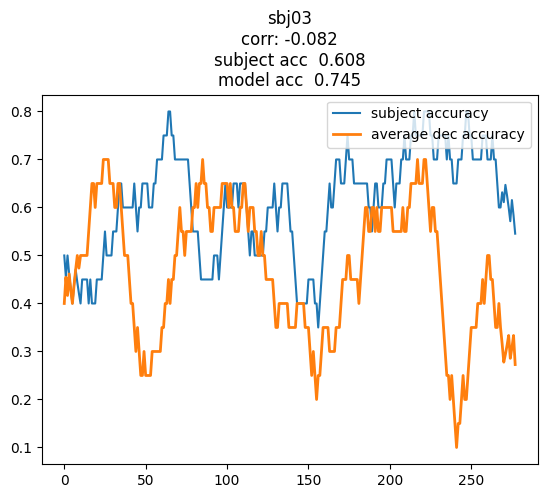

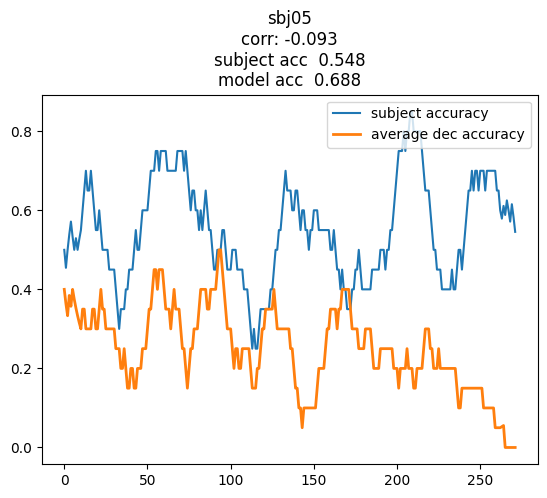

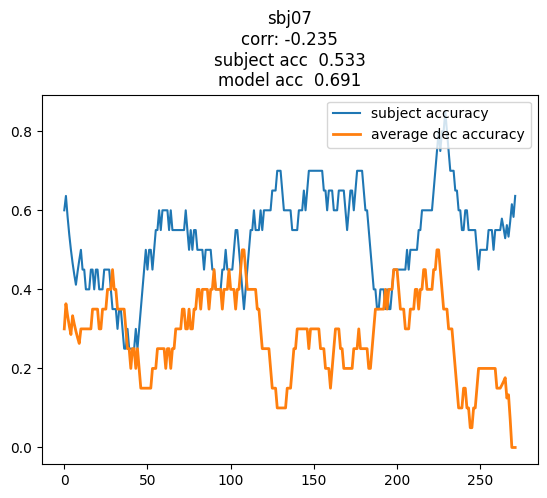

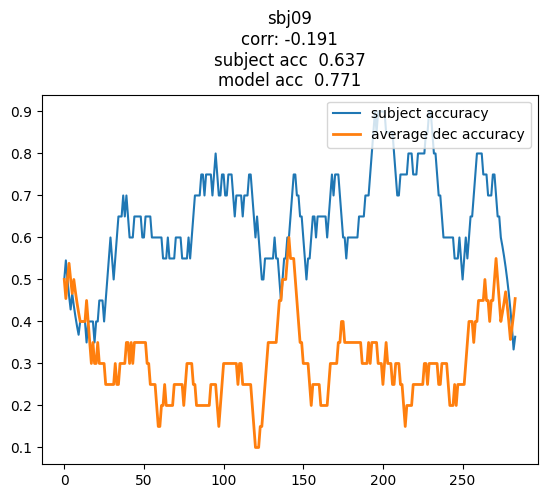

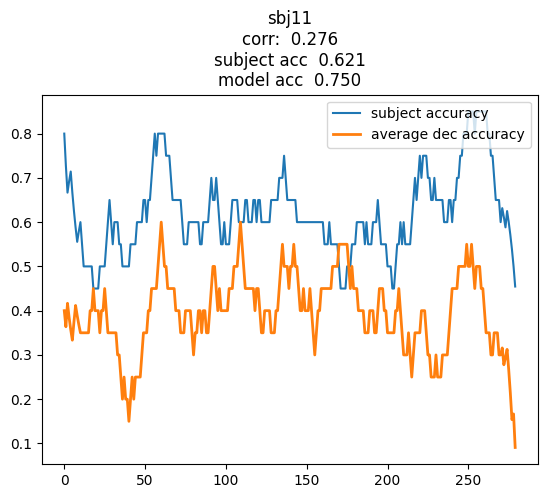

...

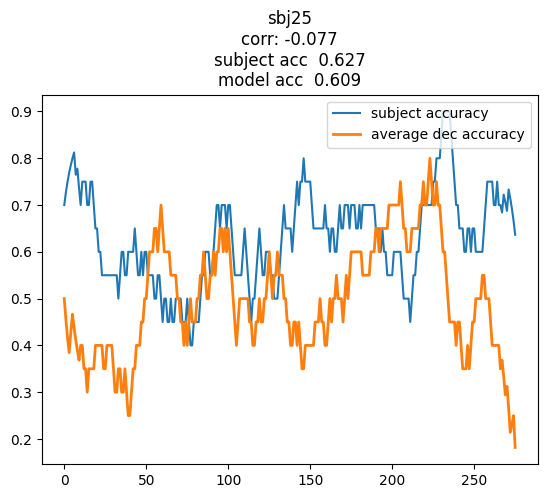

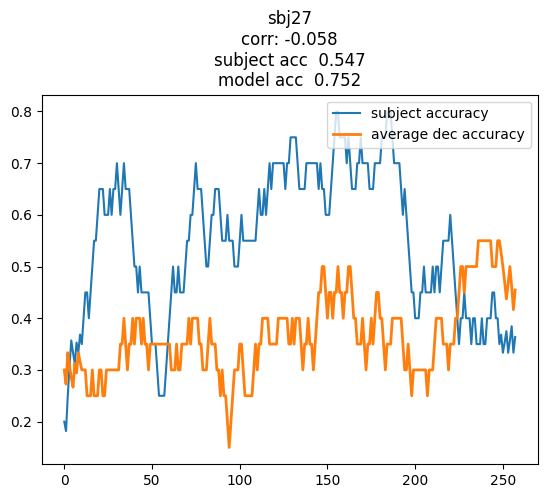

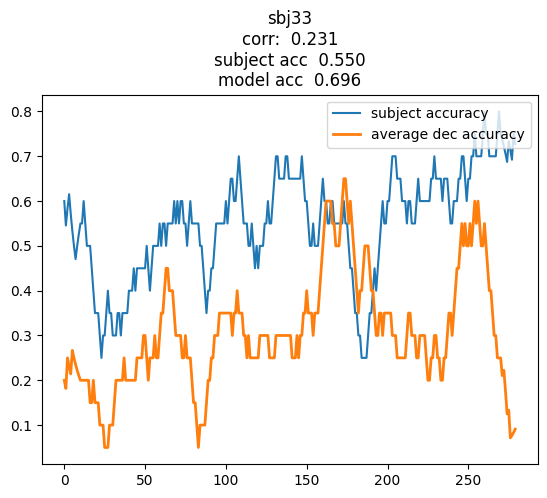

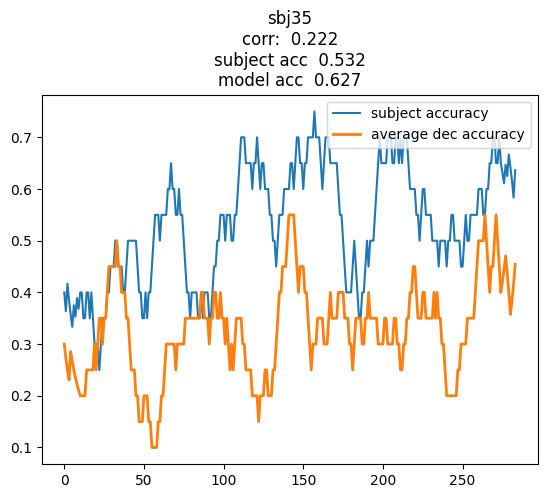

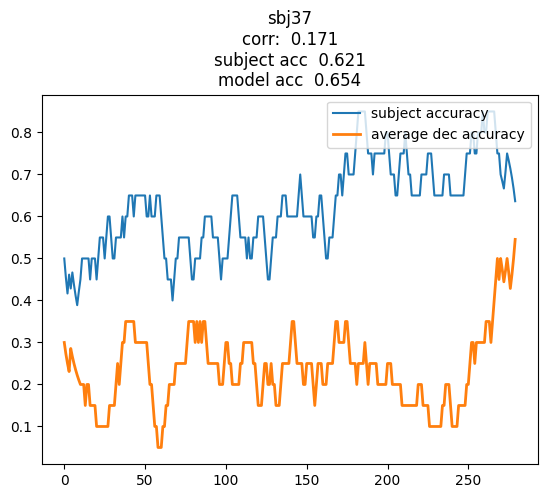

In [139]:
print(
    'Learn odd, test even\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

for s in cv_subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

Learn odd, test even
 mean abs corr:  0.231; mean corr:  0.157; mean subject acc:  0.652; mean model acc:  0.689;


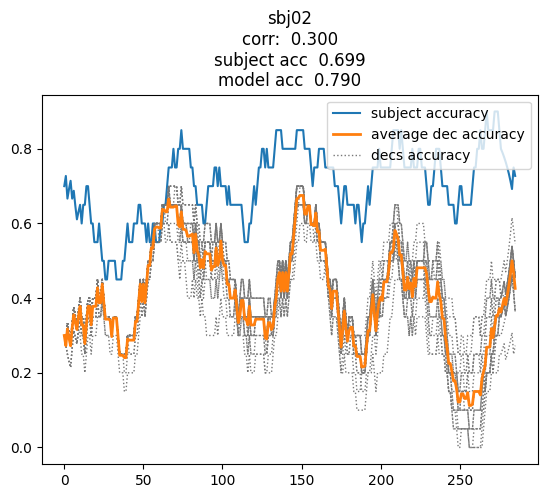

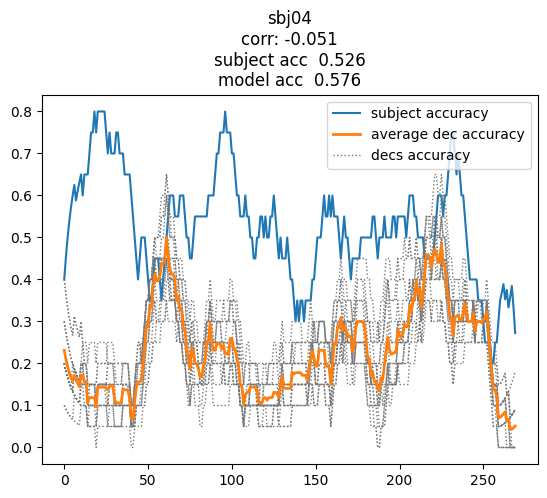

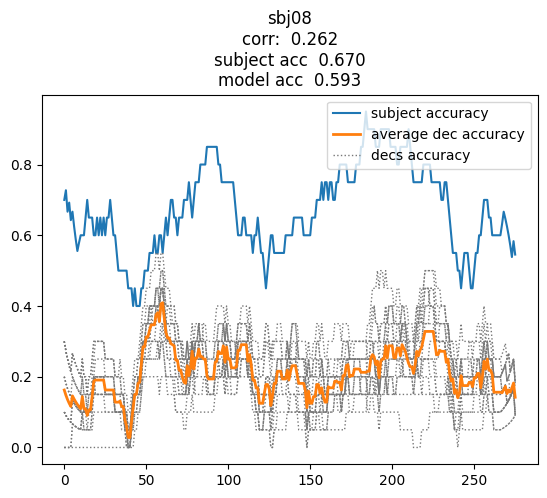

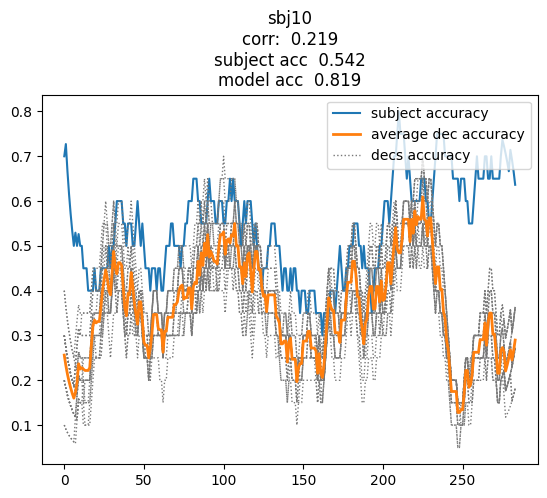

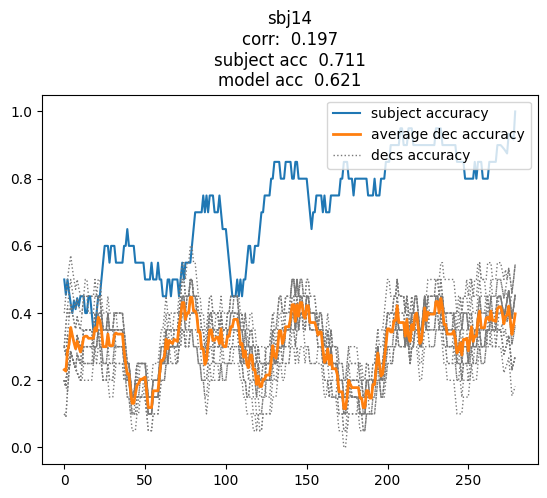

...

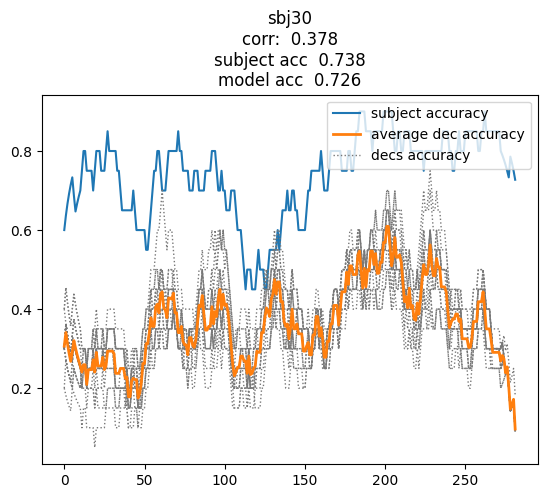

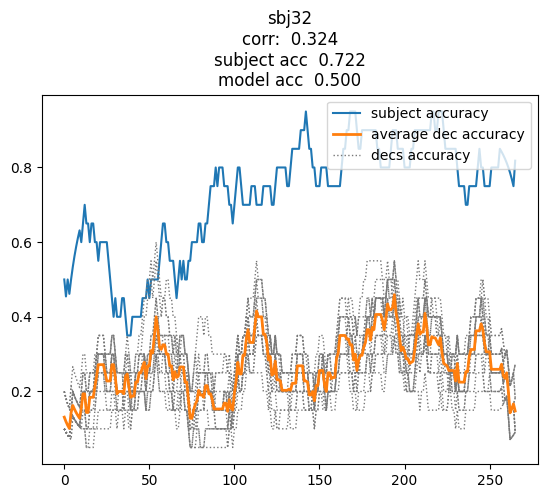

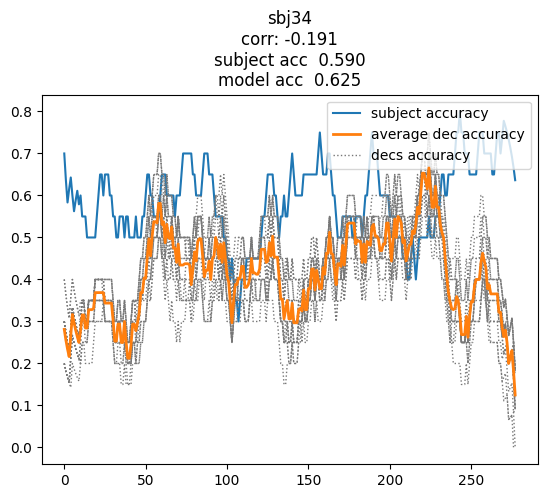

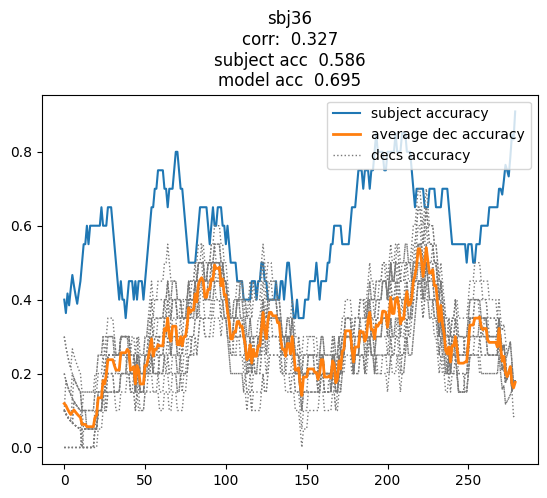

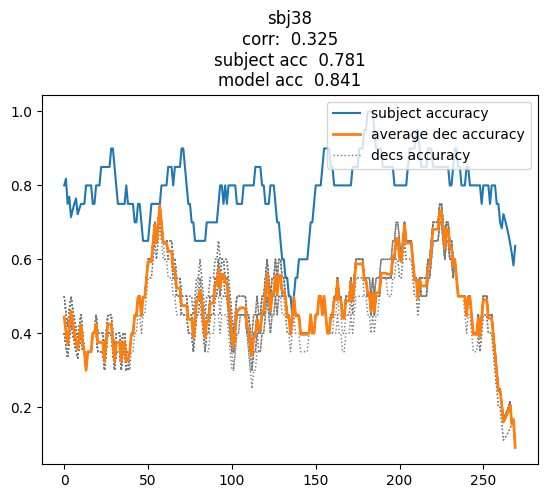

In [143]:
print(
    'Learn odd, test even\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)

for s in subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    for a in s.accs:
        plt.plot(a, color='#777', linewidth=1, linestyle=':')
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

In [144]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '150623_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 39, 2)),
    generalizing_subjects = list(range(2, 39, 2)),
    excluded_subjects = {12}
)

Learn even, test odd
 mean abs corr:  0.276; mean corr:  0.166; mean subject acc:  0.652; mean model acc:  0.699;


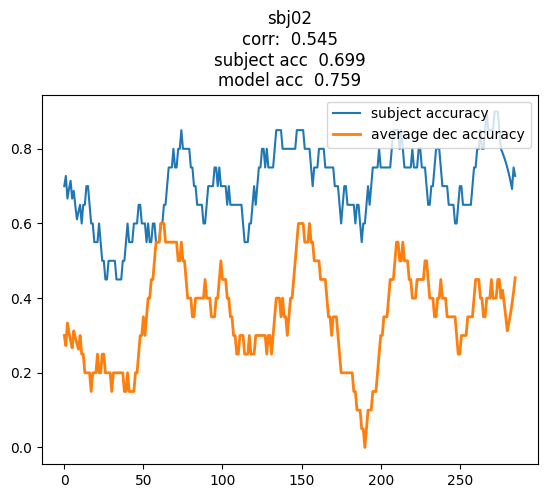

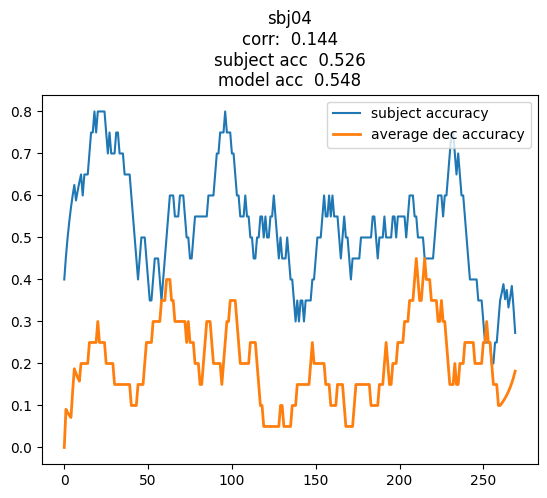

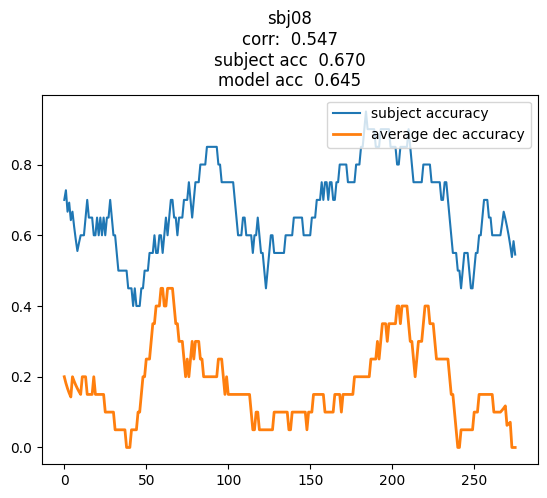

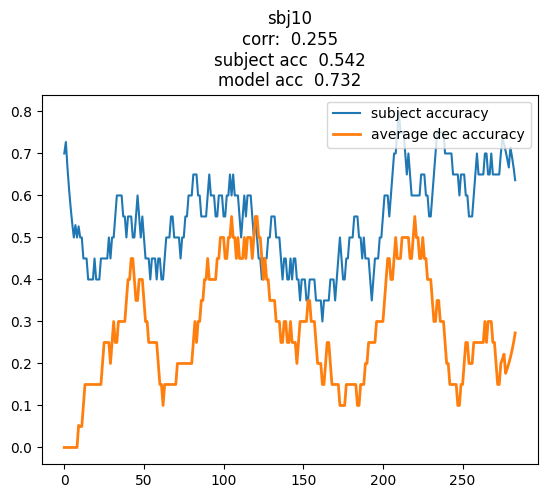

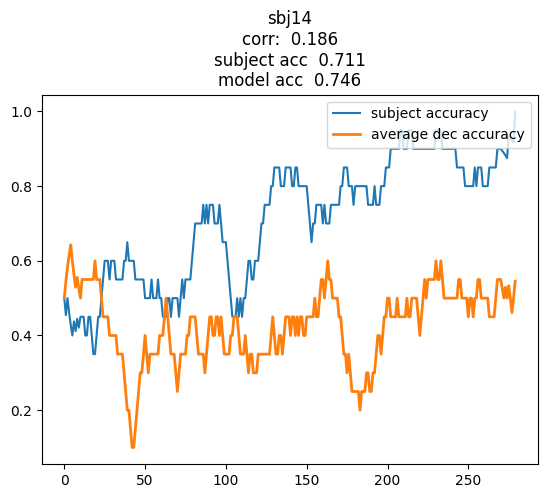

...

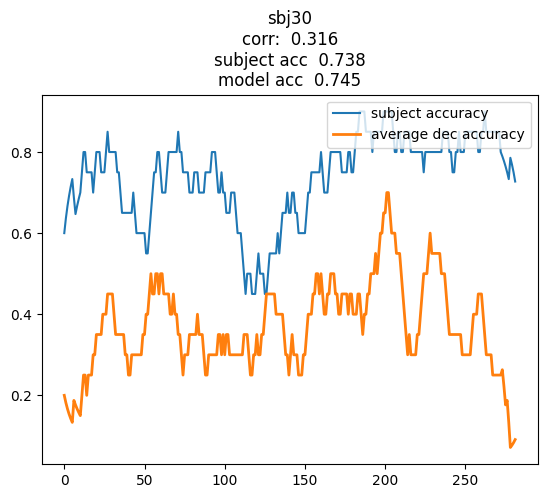

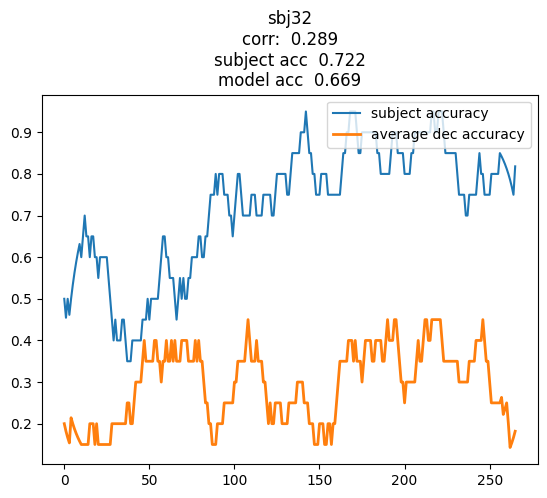

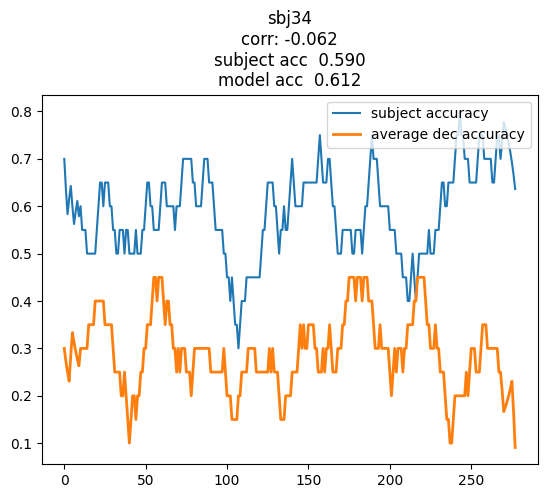

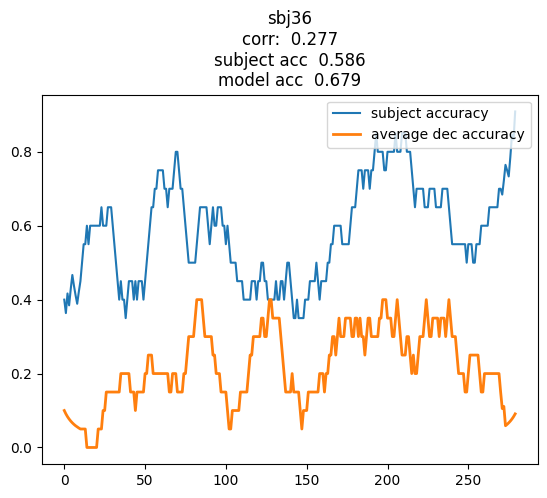

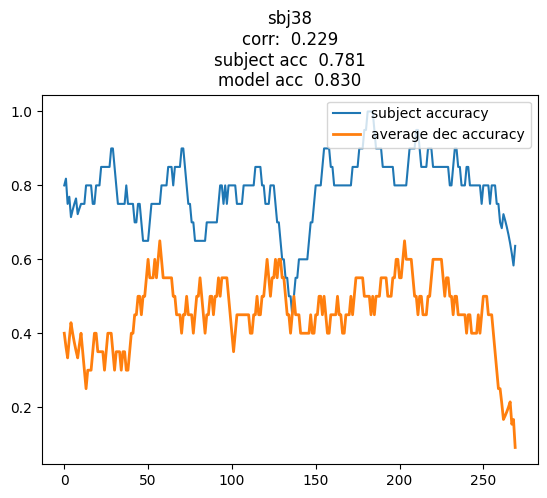

In [145]:
print(
    'Learn even, test odd\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

for s in cv_subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

Learn even, test odd
 mean abs corr:  0.189; mean corr:  0.004; mean subject acc:  0.605; mean model acc:  0.698;


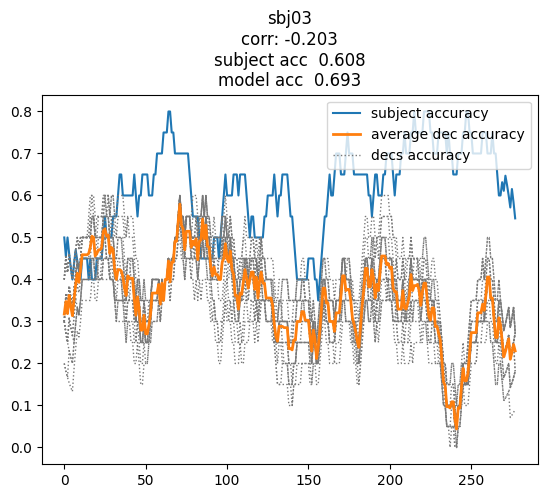

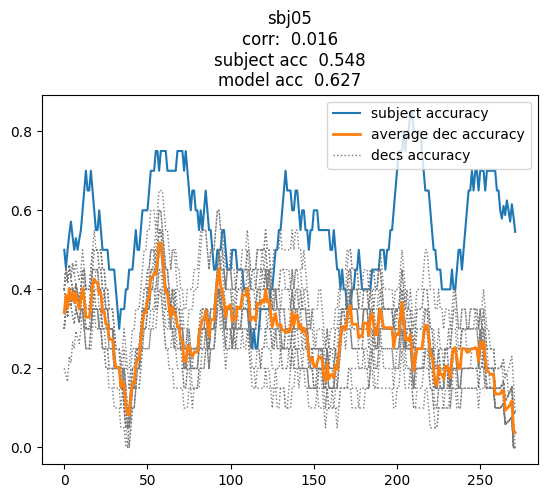

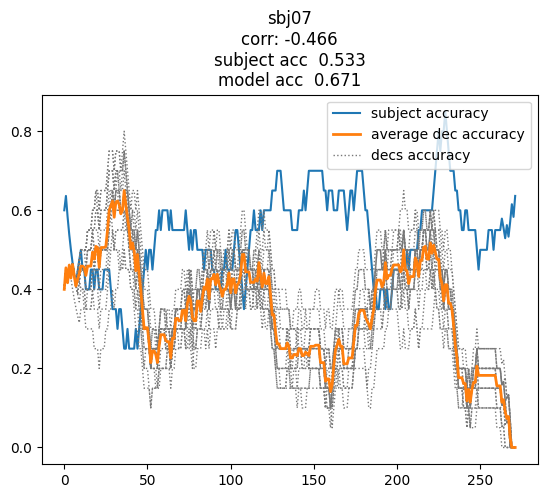

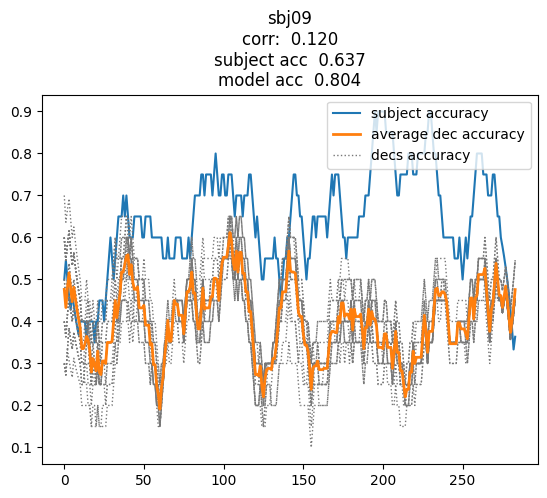

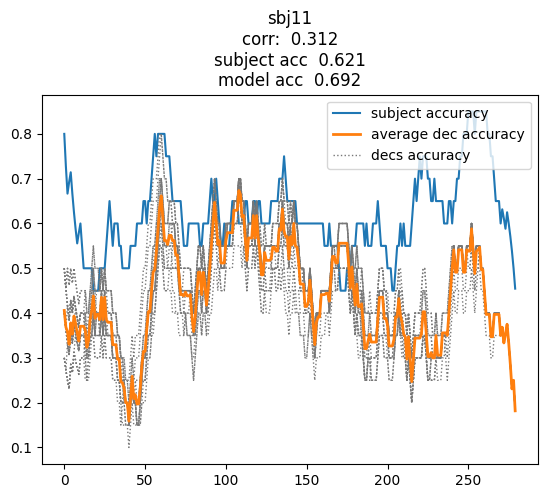

...

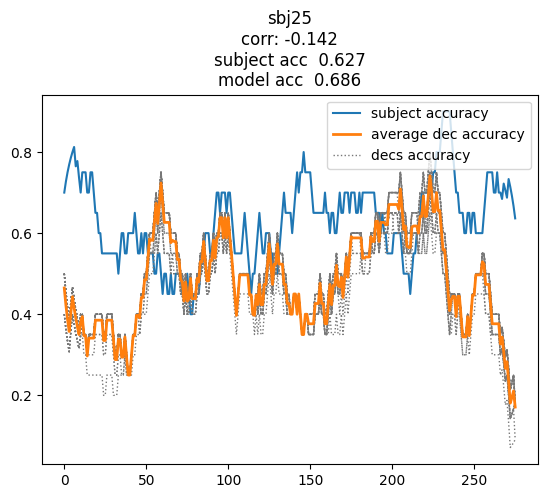

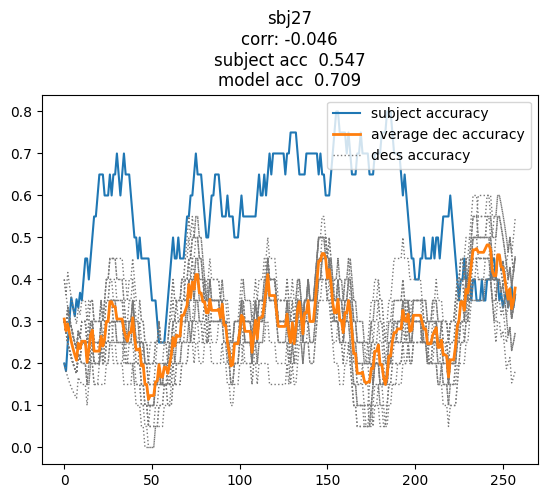

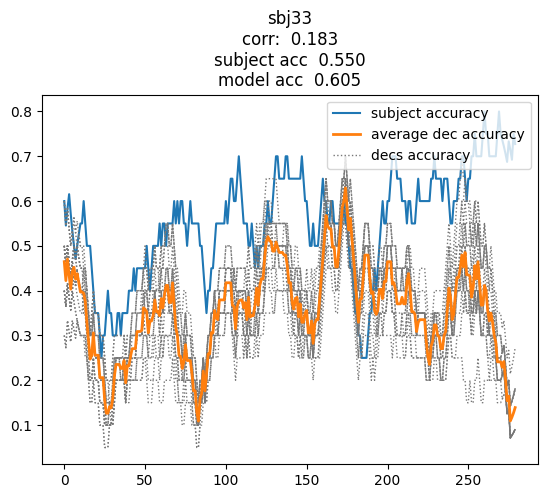

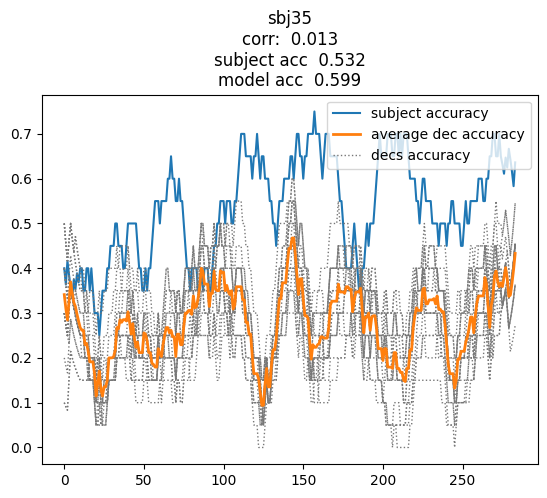

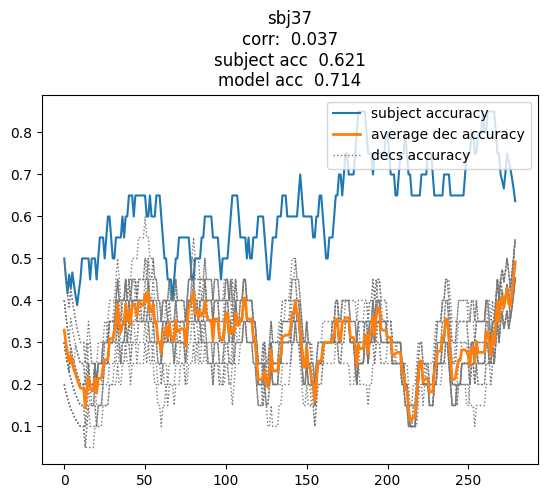

In [146]:
print(
    'Learn even, test odd\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)

for s in subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    for a in s.accs:
        plt.plot(a, color='#777', linewidth=1, linestyle=':')
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

In [4]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '150623_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 39, 2)),
    generalizing_subjects = list(range(1, 39, 2)),
    excluded_subjects = {12}
)

#### 1st half and 2nd half splitted

In [12]:
for subject in subjects:
    

[0.3349691509044258,
 0.32109969355562795,
 0.3933459469940851,
 0.21966631834942665,
 0.2586824821687787,
 0.32766590422561837,
 0.330656592254349,
 0.23187319919332774,
 0.18757612637357413,
 0.4902122423651322,
 0.21137966937505515,
 0.24813685183102285,
 0.2192554568427299,
 0.3170297065874176,
 0.4097183264818082,
 0.2967396038077488]

## S vs C stim

In [3]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '040723_odd2eve_training_s_vs_c_lfcnn_stim',
    generalized_subjects = list(range(2, 39, 2)),
    generalizing_subjects = list(range(1, 39, 2)),
    excluded_subjects = {12}
)

print(
    'Learn odd, test even (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn odd, test even (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '040723_eve2odd_training_s_vs_c_lfcnn_stim',
    generalized_subjects = list(range(1, 39, 2)),
    generalizing_subjects = list(range(2, 39, 2)),
    excluded_subjects = {12}
)

print(
    'Learn even, test odd (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn even, test odd (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

Learn odd, test even (generalized)
 mean abs corr:  0.268; mean corr:  0.198; mean subject acc:  0.651; mean model acc:  0.661;
Learn odd, test even (generalizing)
 mean abs corr:  0.242; mean corr:  0.093; mean subject acc:  0.606; mean model acc:  0.689;
Learn even, test odd (generalized)
 mean abs corr:  0.185; mean corr:  0.031; mean subject acc:  0.606; mean model acc:  0.668;
Learn even, test odd (generalizing)
 mean abs corr:  0.272; mean corr:  0.187; mean subject acc:  0.651; mean model acc:  0.676;


## Action

In [167]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '200623_odd2eve_training_action_lfcnn',
    generalized_subjects = list(range(2, 39, 2)),
    generalizing_subjects = list(range(1, 39, 2)),
    excluded_subjects = {12},
    target_column='Action'
)

print(
    'Learn odd, test even (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn odd, test even (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '200623_eve2odd_training_action_lfcnn',
    generalized_subjects = list(range(1, 39, 2)),
    generalizing_subjects = list(range(2, 39, 2)),
    excluded_subjects = {12},
    target_column='Action'
)

print(
    'Learn even, test odd (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn even, test odd (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

Learn odd, test even (generalized)
 mean abs corr:  0.354; mean corr: -0.253; mean subject acc:  0.651; mean model acc:  0.743;
Learn odd, test even (generalizing)
 mean abs corr:  0.332; mean corr: -0.199; mean subject acc:  0.606; mean model acc:  0.810;
Learn even, test odd (generalized)
 mean abs corr:  0.296; mean corr: -0.210; mean subject acc:  0.606; mean model acc:  0.792;
Learn even, test odd (generalizing)
 mean abs corr:  0.339; mean corr: -0.196; mean subject acc:  0.651; mean model acc:  0.712;


In [169]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '200623_odd2eve_training_action_lfcnn',
    generalized_subjects = list(range(2, 39, 2)),
    generalizing_subjects = list(range(1, 39, 2)),
    excluded_subjects = {12},
    target_column='Action'
)

Learn odd, test even
 mean abs corr:  0.339; mean corr: -0.196; mean subject acc:  0.651; mean model acc:  0.712;


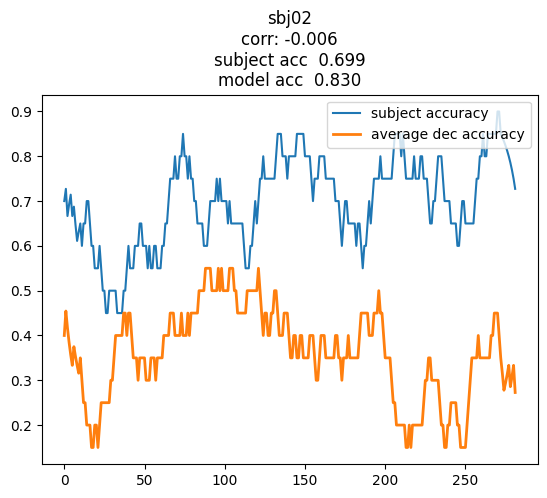

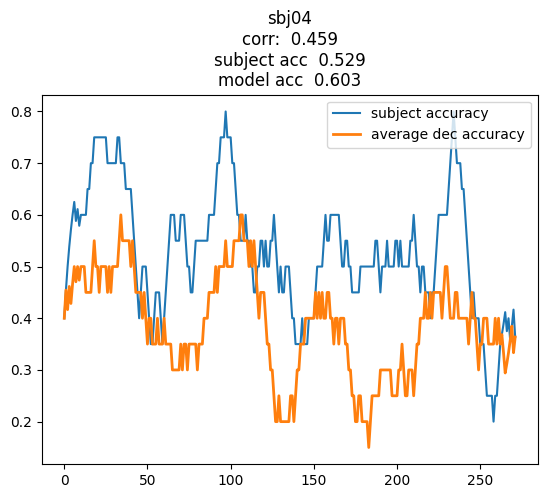

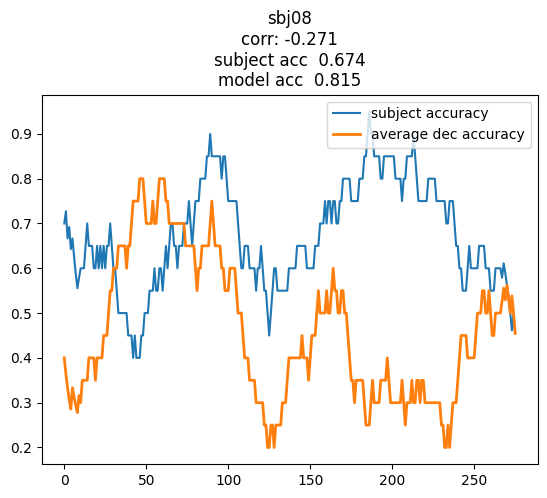

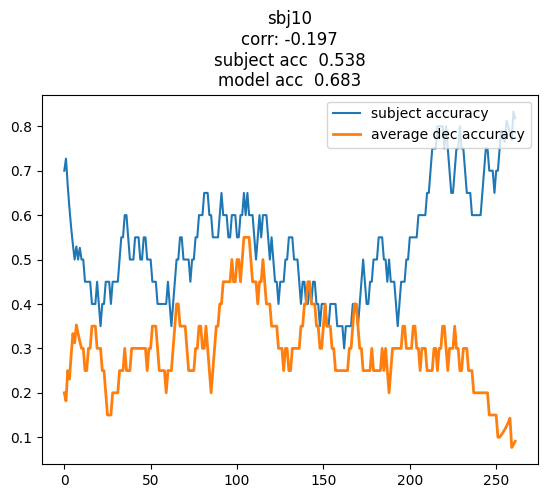

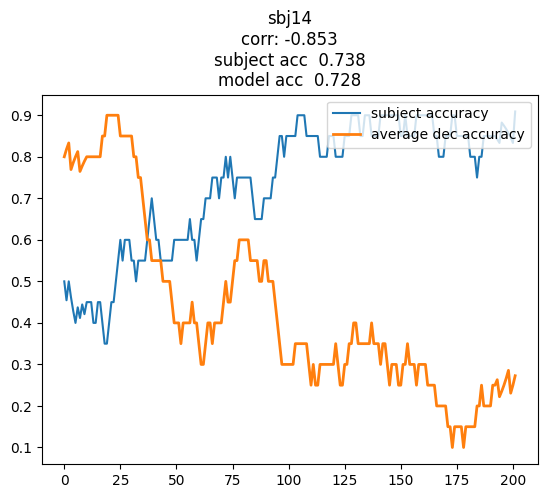

...

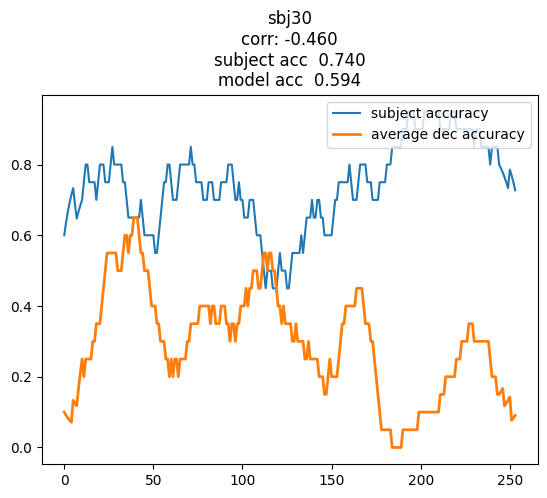

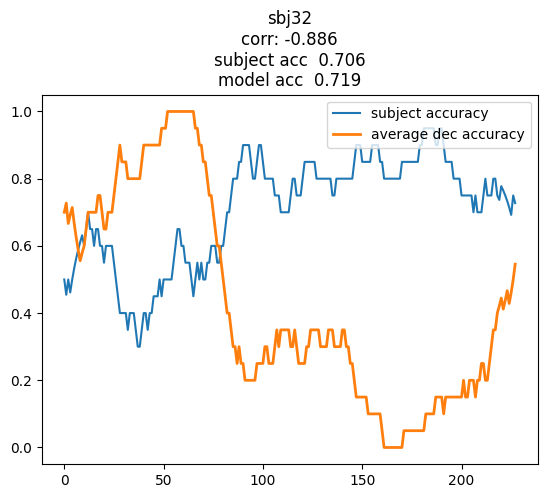

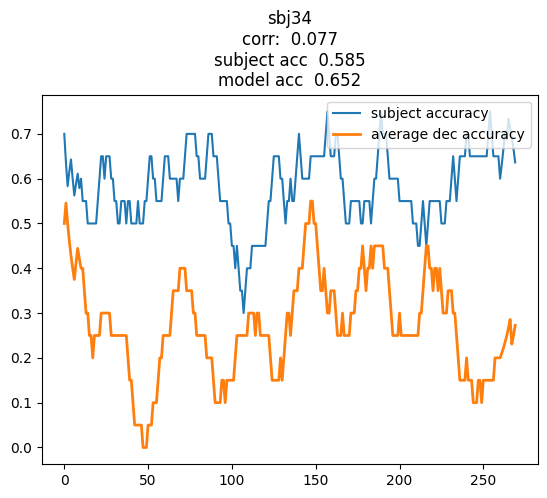

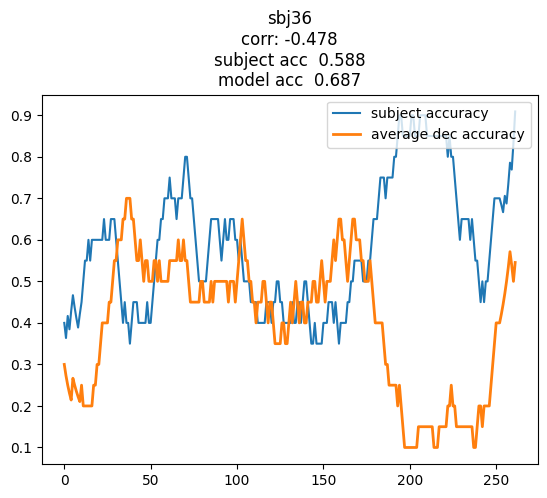

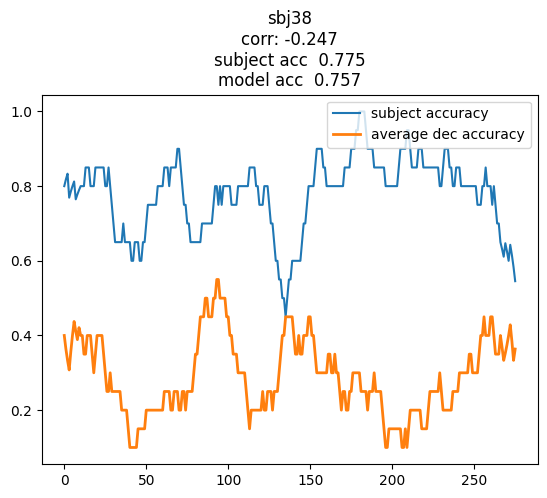

In [176]:
print(
    'Learn odd, test even\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

for s in cv_subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

Learn odd, test even
 mean abs corr:  0.354; mean corr: -0.253; mean subject acc:  0.651; mean model acc:  0.743;


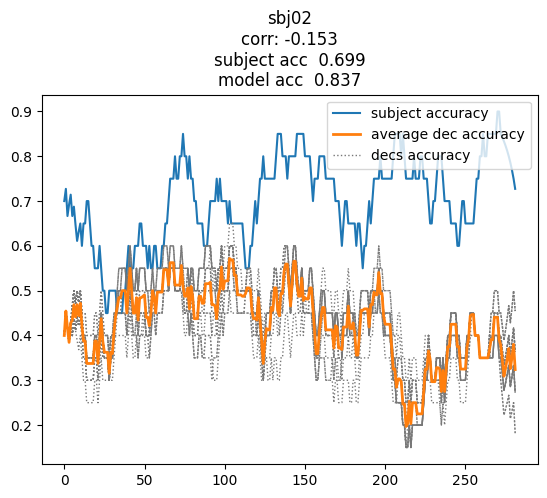

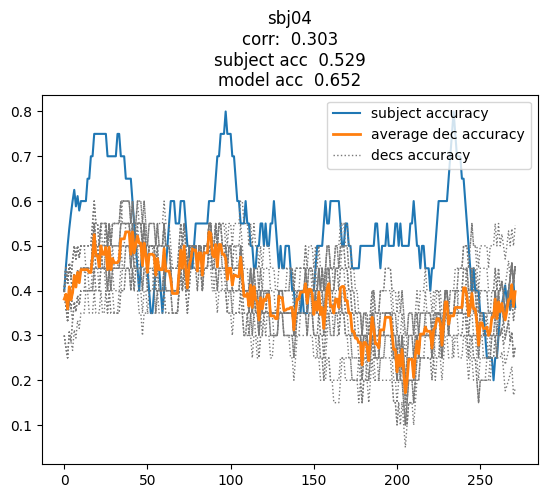

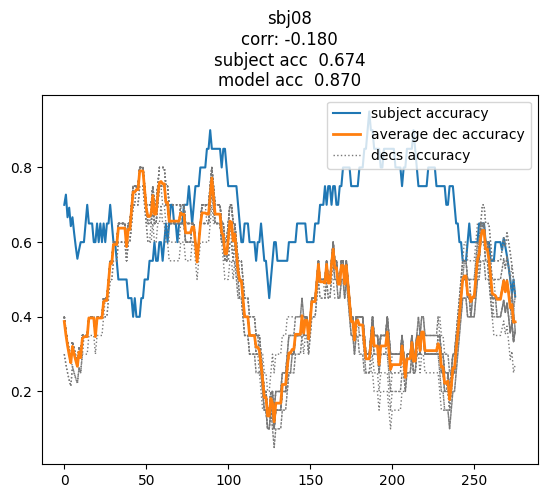

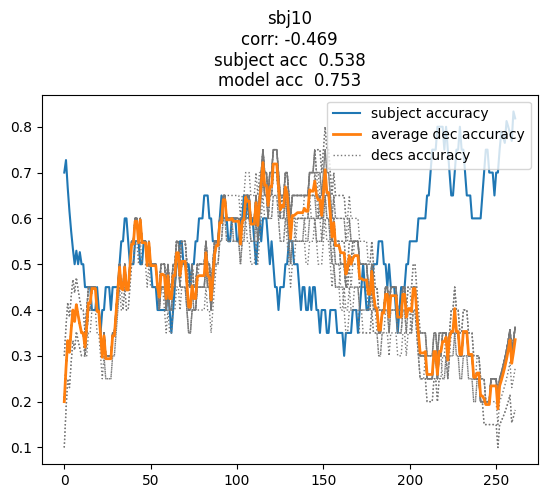

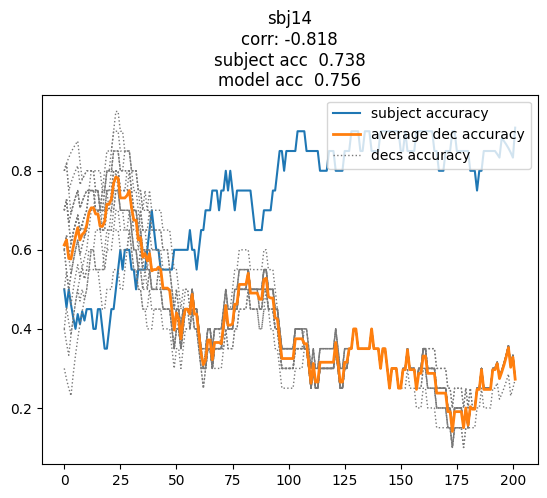

...

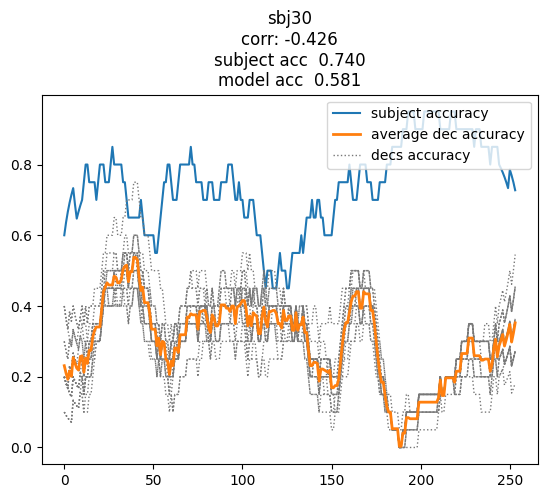

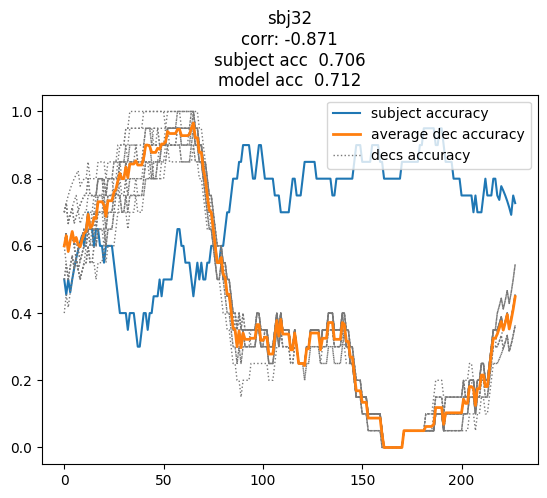

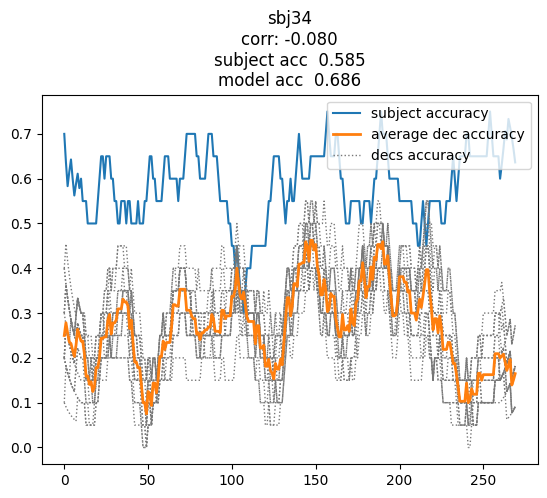

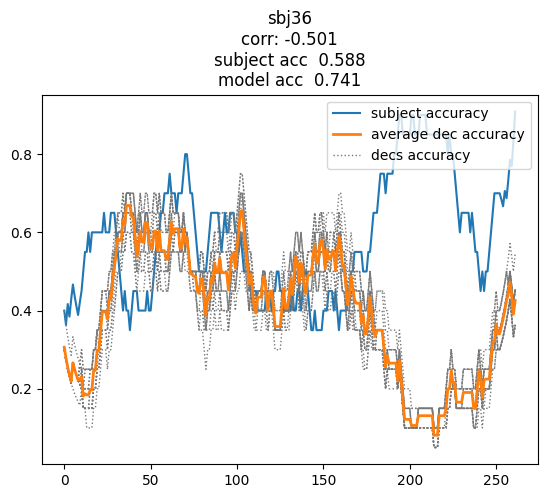

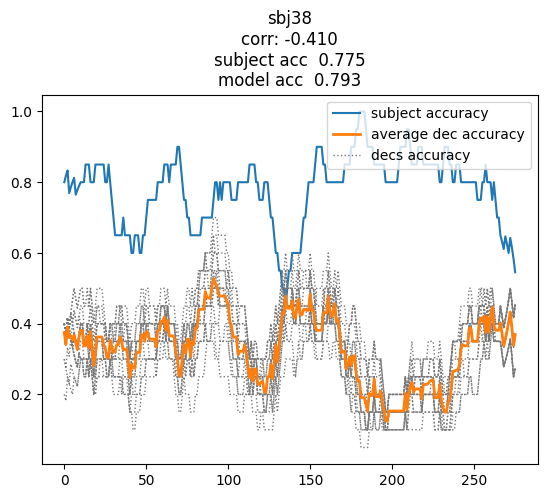

In [172]:
print(
    'Learn odd, test even\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)

for s in subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    for a in s.accs:
        plt.plot(a, color='#777', linewidth=1, linestyle=':')
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

In [173]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '200623_eve2odd_training_action_lfcnn',
    generalized_subjects = list(range(1, 39, 2)),
    generalizing_subjects = list(range(2, 39, 2)),
    excluded_subjects = {12},
    target_column='Action'
)

Learn even, test odd
 mean abs corr:  0.339; mean corr: -0.196; mean subject acc:  0.651; mean model acc:  0.712;


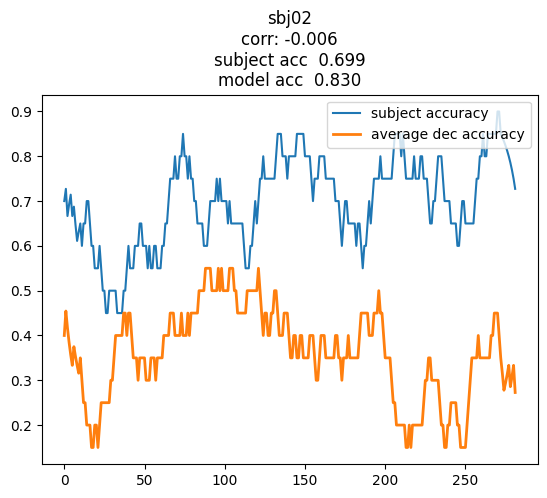

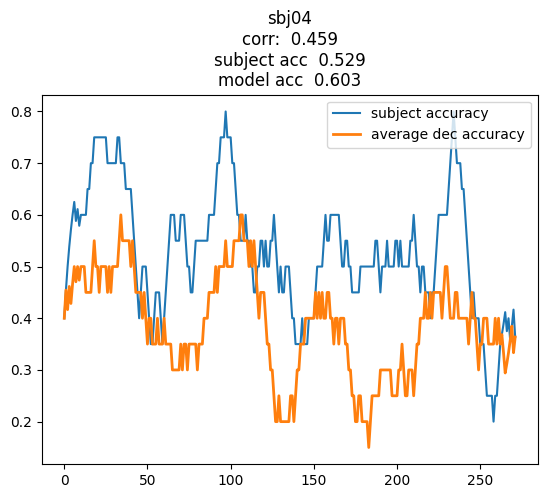

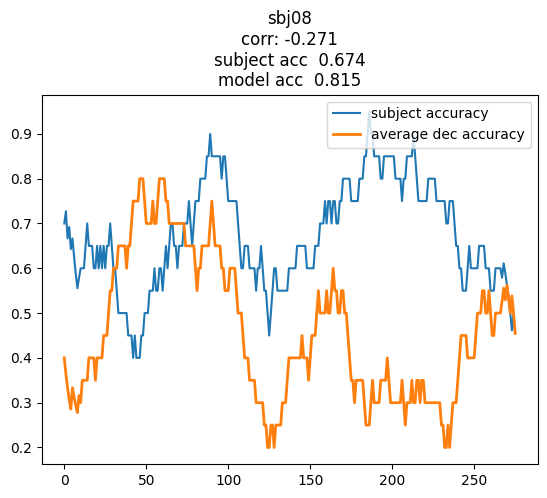

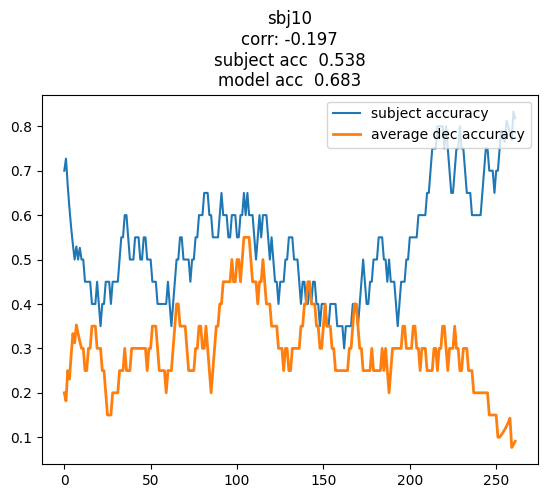

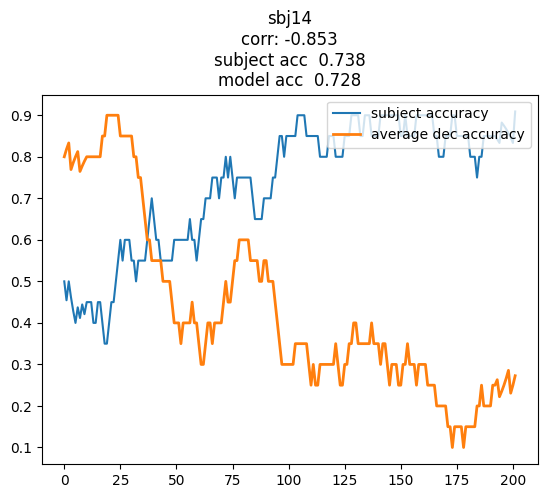

...

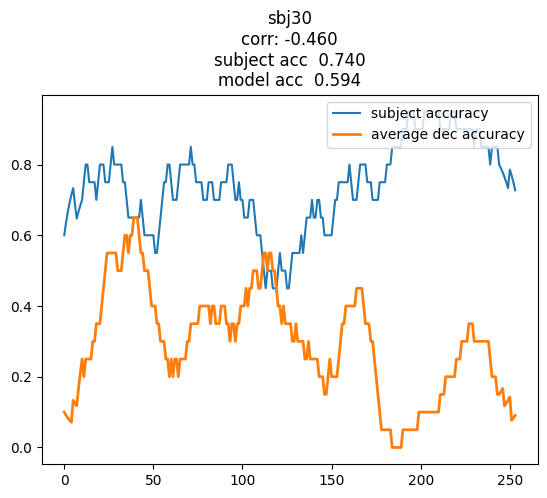

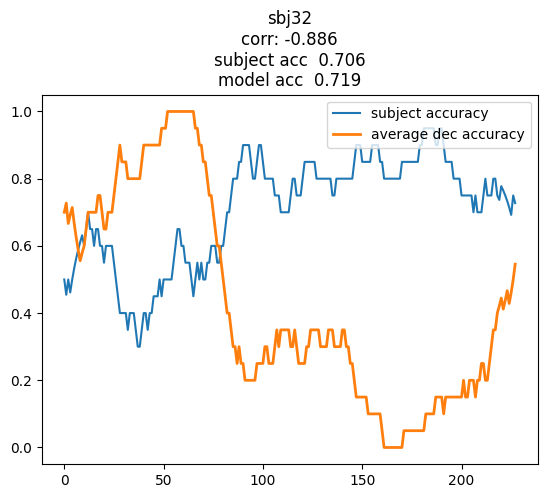

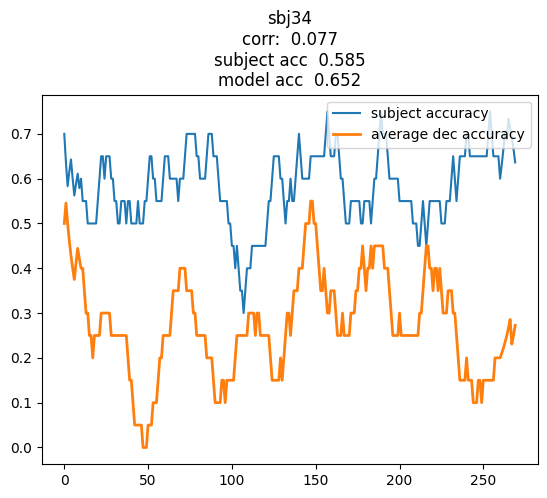

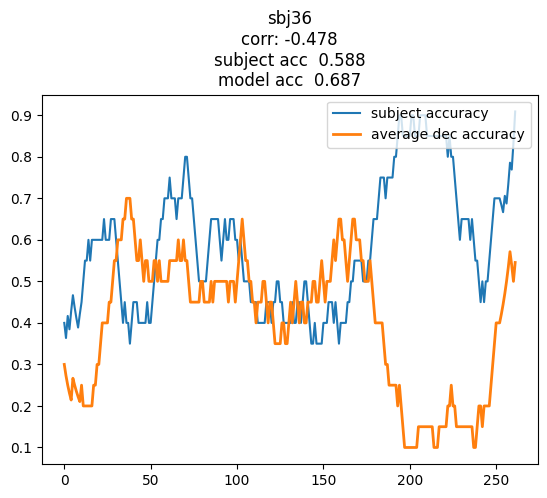

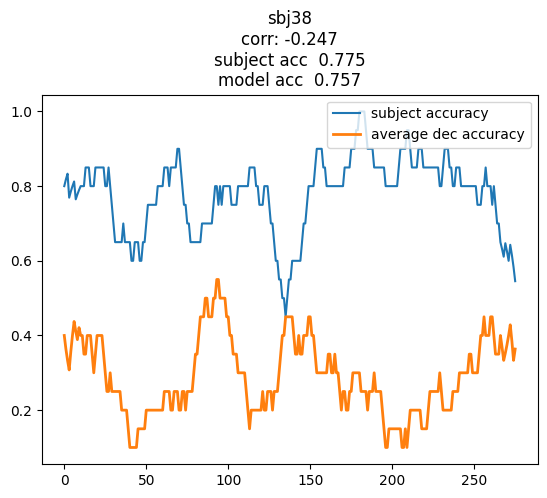

In [174]:
print(
    'Learn even, test odd\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

for s in cv_subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

Learn even, test odd
 mean abs corr:  0.296; mean corr: -0.210; mean subject acc:  0.606; mean model acc:  0.792;


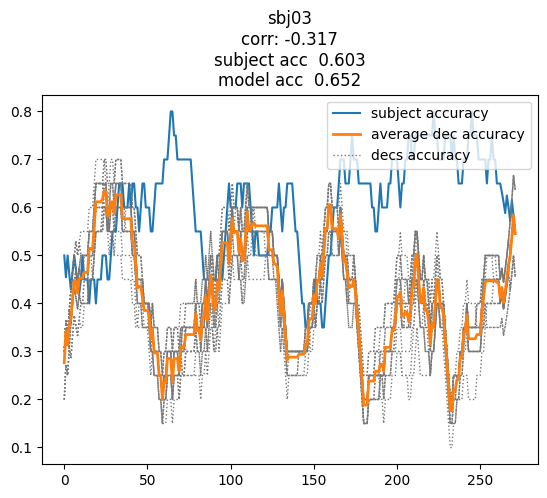

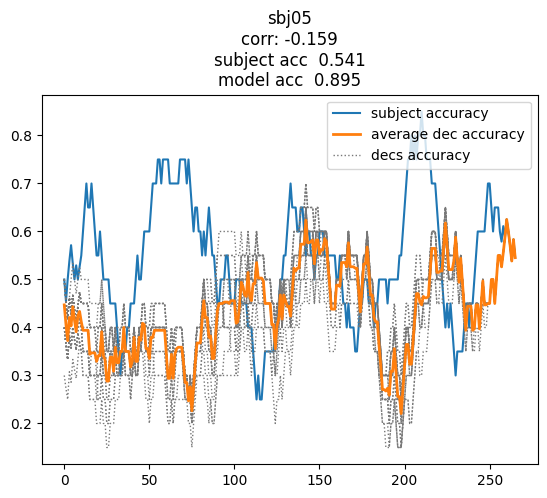

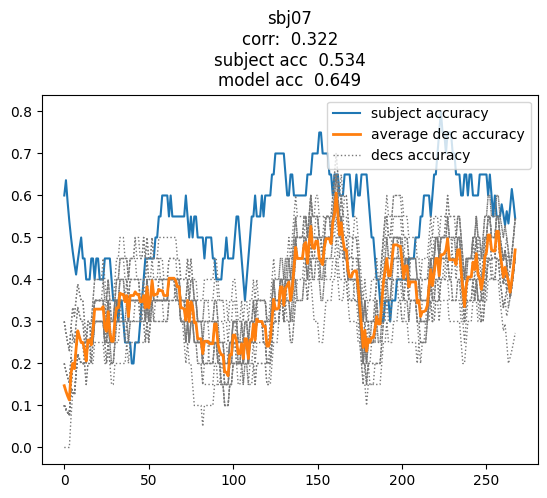

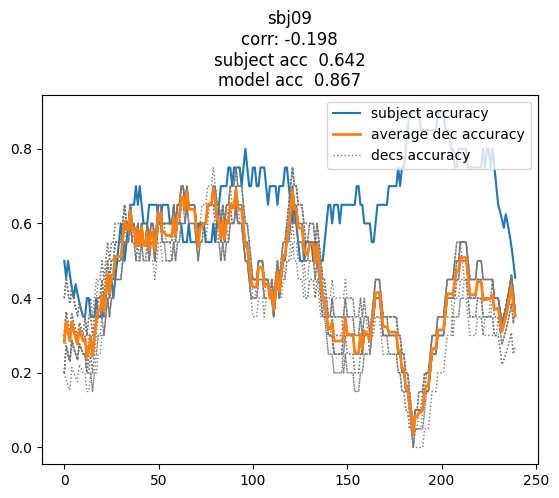

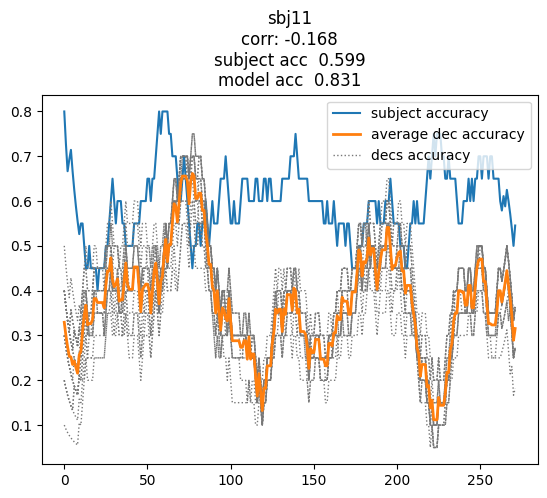

...

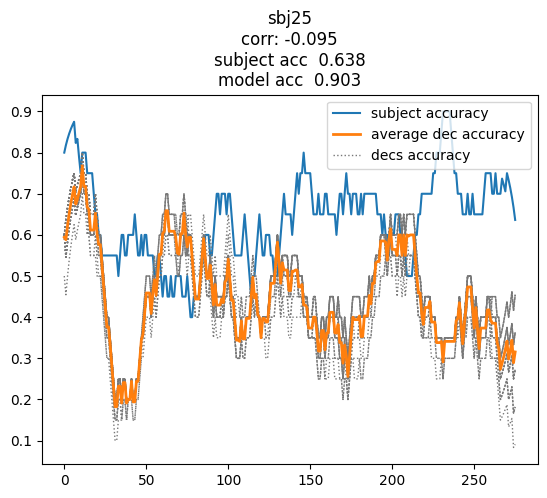

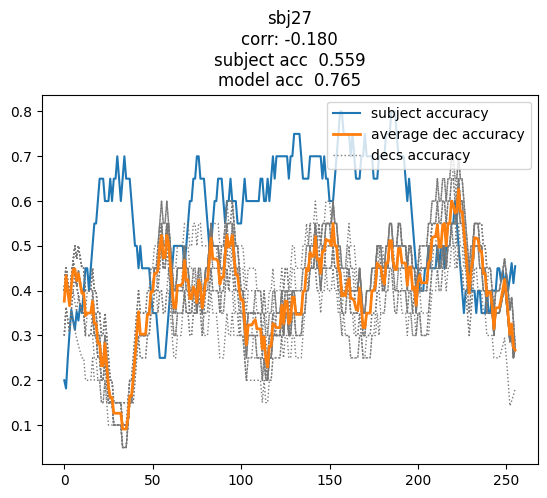

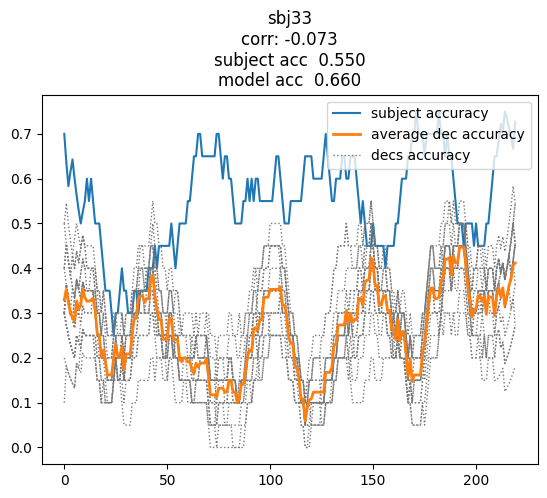

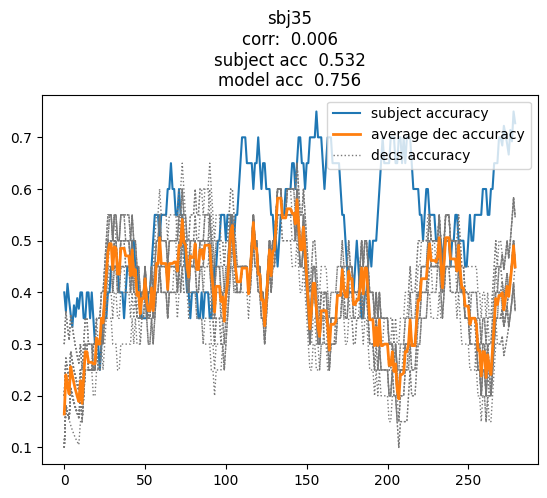

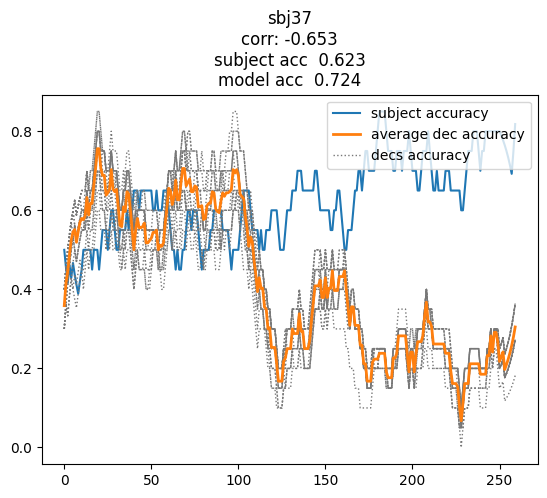

In [175]:
print(
    'Learn even, test odd\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)

for s in subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    for a in s.accs:
        plt.plot(a, color='#777', linewidth=1, linestyle=':')
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

## Feedback

In [180]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '200623_odd2eve_training_feedback_lfcnn',
    generalized_subjects = list(range(2, 39, 2)),
    generalizing_subjects = list(range(1, 39, 2)),
    excluded_subjects = {12},
    target_column='Feedback'
)

print(
    'Learn odd, test even (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn odd, test even (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '200623_eve2odd_training_feedback_lfcnn',
    generalized_subjects = list(range(1, 39, 2)),
    generalizing_subjects = list(range(2, 39, 2)),
    excluded_subjects = {12},
    target_column='Feedback'
)

print(
    'Learn even, test odd (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn even, test odd (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

Learn odd, test even (generalized)
 mean abs corr:  0.693; mean corr:  0.689; mean subject acc:  0.500; mean model acc:  0.583;
Learn odd, test even (generalizing)
 mean abs corr:  0.736; mean corr:  0.736; mean subject acc:  0.500; mean model acc:  0.624;
Learn even, test odd (generalized)
 mean abs corr:  0.665; mean corr:  0.665; mean subject acc:  0.500; mean model acc:  0.573;
Learn even, test odd (generalizing)
 mean abs corr:  0.699; mean corr:  0.699; mean subject acc:  0.500; mean model acc:  0.560;


In [177]:

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '200623_odd2eve_training_feedback_lfcnn',
    generalized_subjects = list(range(2, 39, 2)),
    generalizing_subjects = list(range(1, 39, 2)),
    excluded_subjects = {12},
    target_column='Feedback'
)

Learn odd, test even
 mean abs corr:  0.736; mean corr:  0.736; mean subject acc:  0.500; mean model acc:  0.624;


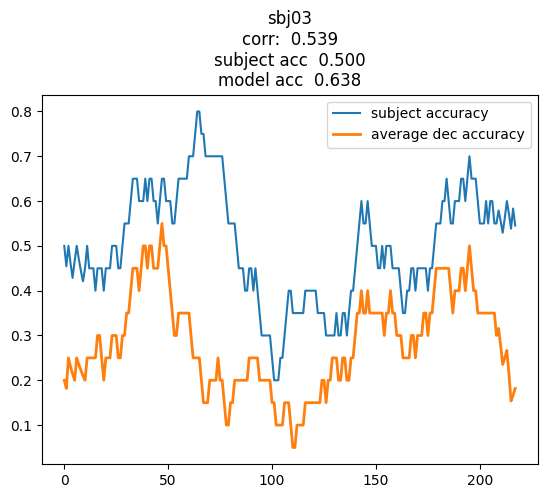

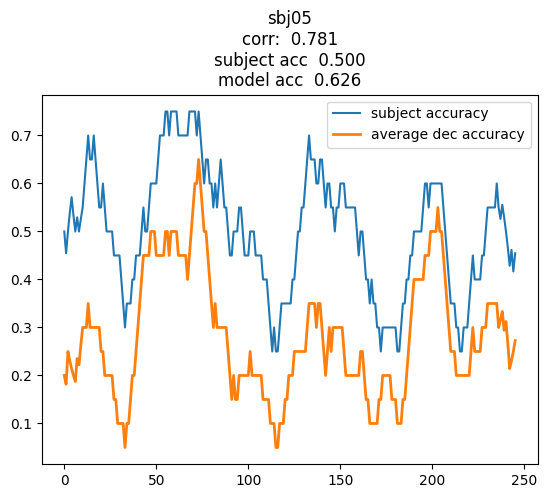

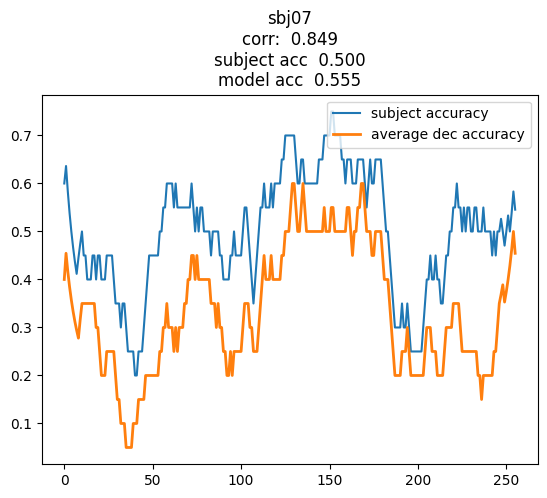

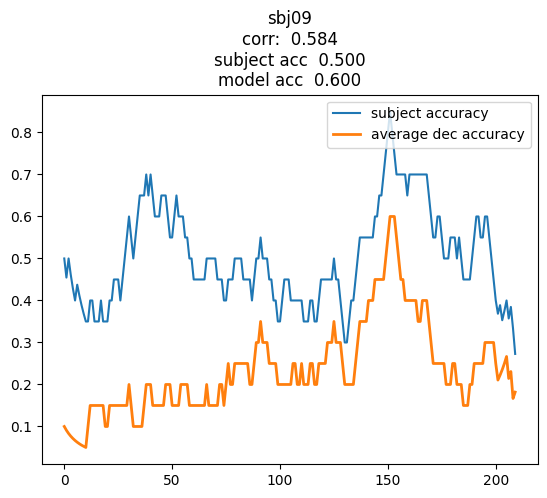

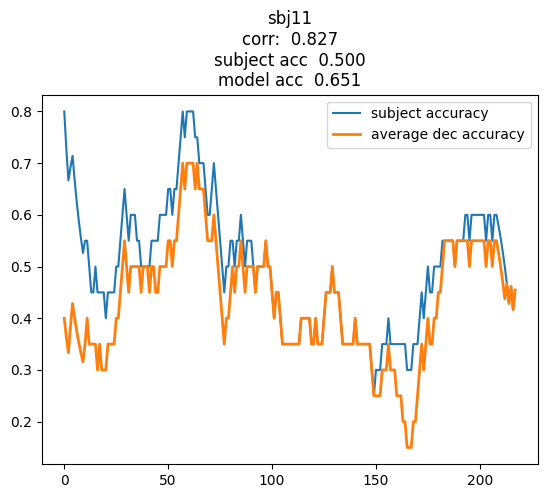

...

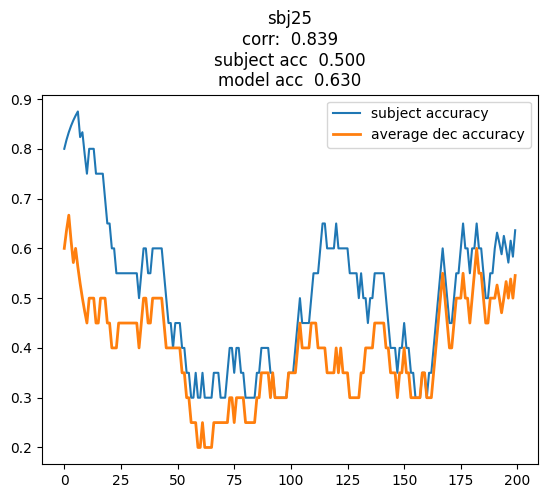

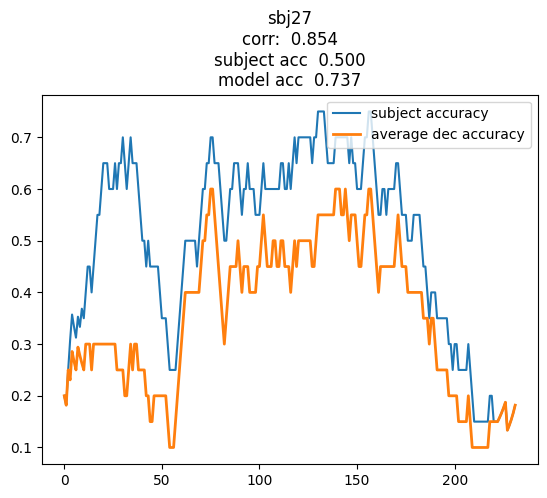

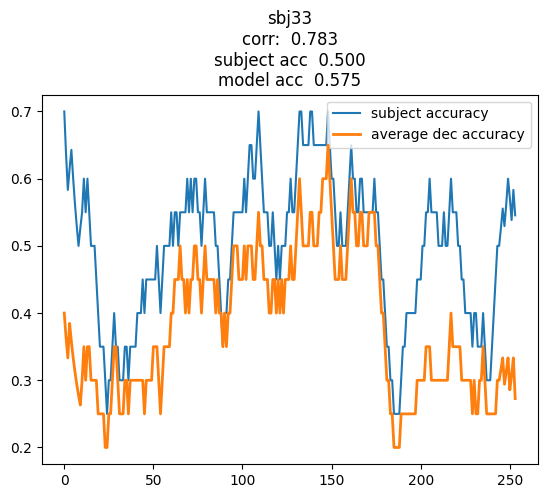

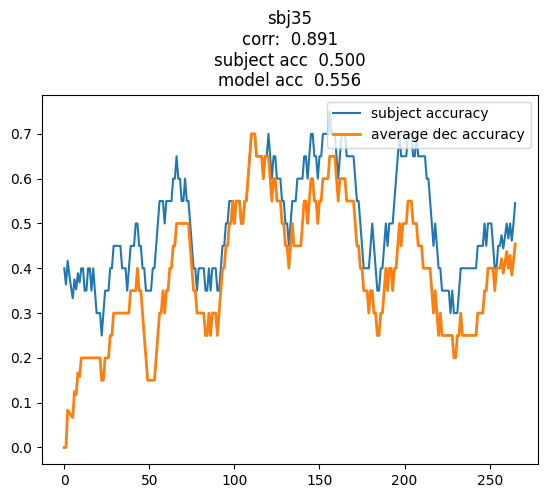

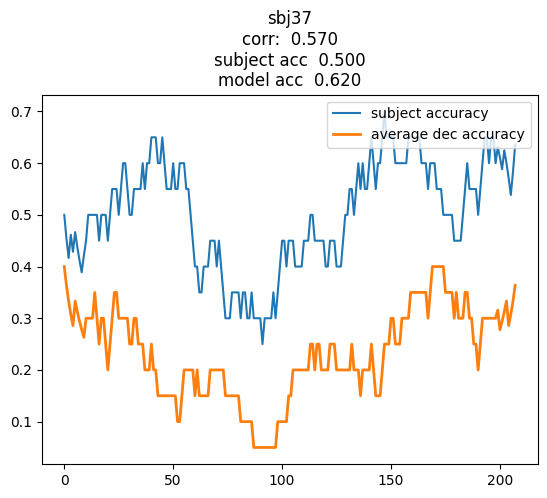

In [178]:
print(
    'Learn odd, test even\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

for s in cv_subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

Learn odd, test even
 mean abs corr:  0.693; mean corr:  0.689; mean subject acc:  0.500; mean model acc:  0.583;


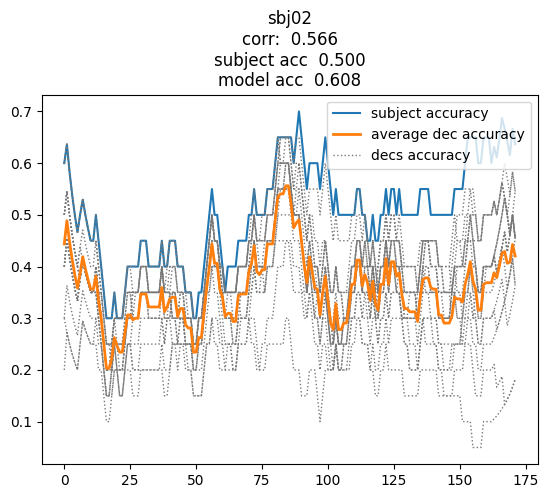

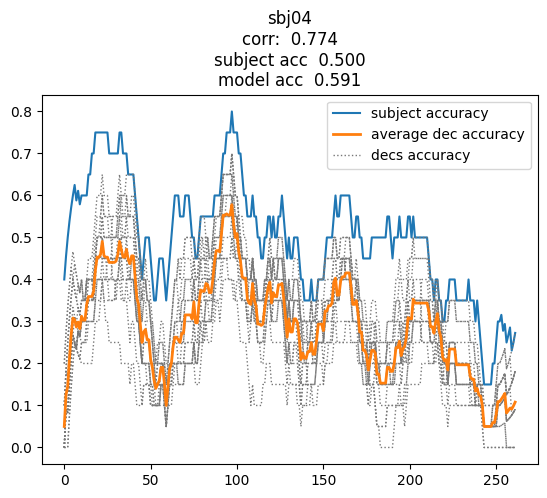

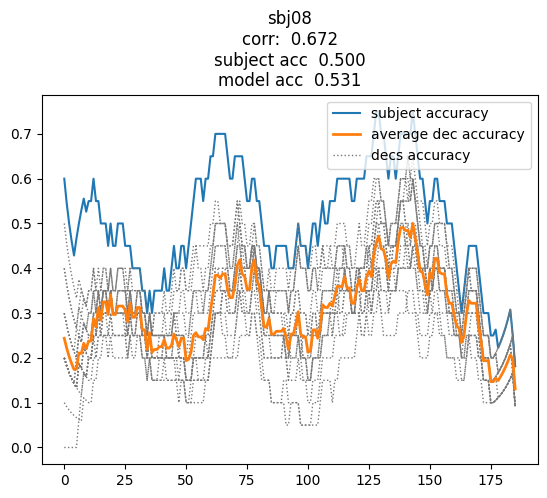

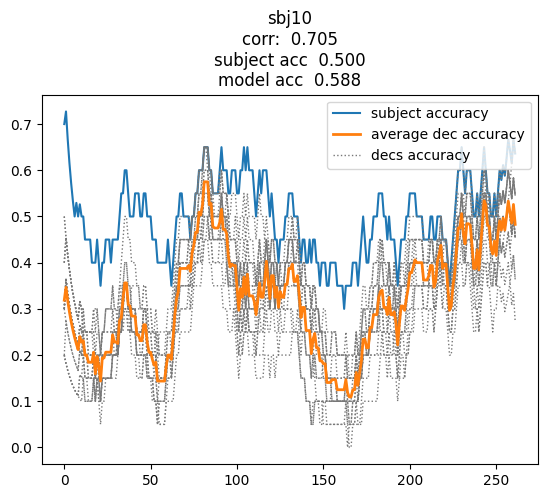

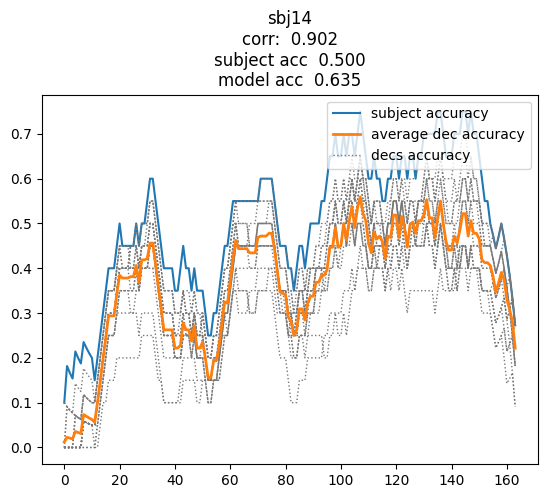

...

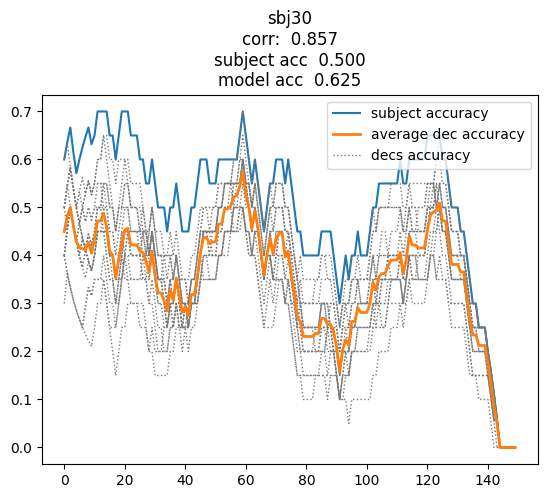

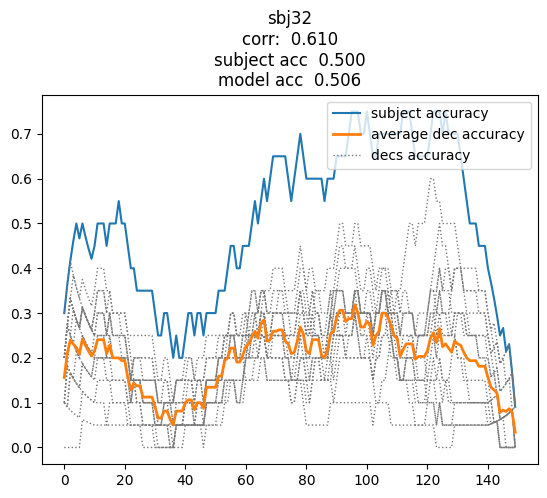

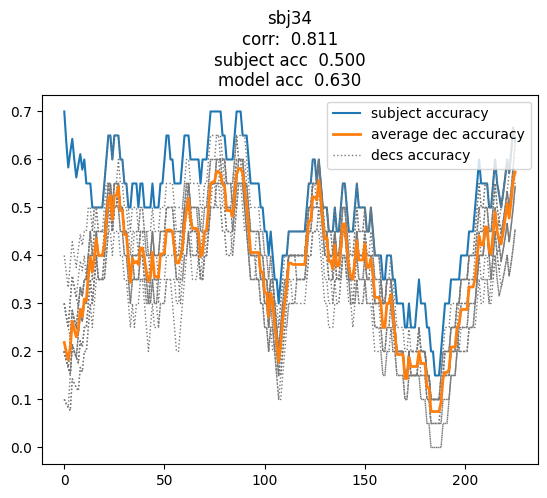

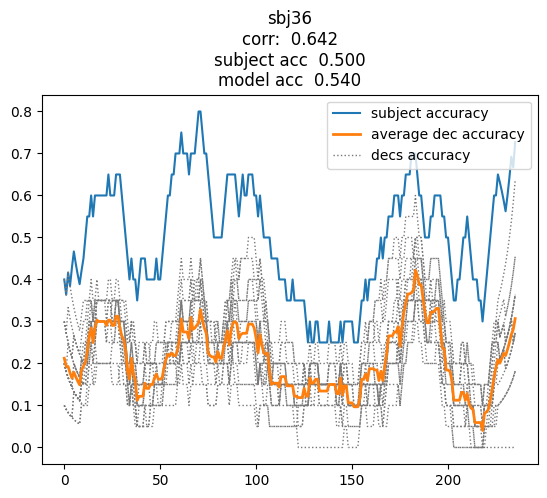

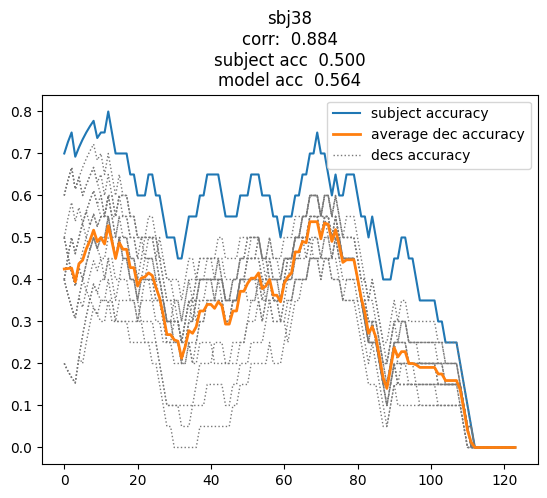

In [179]:
print(
    'Learn odd, test even\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)

for s in subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    for a in s.accs:
        plt.plot(a, color='#777', linewidth=1, linestyle=':')
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()